In [3]:
import pandas as pd
import numpy as np
from sklearn.datasets import load_boston

boston_data=load_boston()

In [4]:
boston = pd.DataFrame(boston_data.data, columns=boston_data.feature_names)

Y = pd.DataFrame(boston_data.target)
X = boston

X.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [120]:
Y.head()

,0
0,24.0
1,21.6
2,34.7
3,33.4
4,36.2


In [121]:
Y.describe()

,0
count,506.000000
mean,22.532806
std,9.197104
min,5.000000
25%,17.025000
50%,21.200000
75%,25.000000
max,50.000000


In [122]:
import tensorflow as tf

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.Dense(8, activation='relu', input_shape=(13,)))
model.add(tf.keras.layers.Dense(16, activation='relu'))
model.add(tf.keras.layers.Dense(8, activation='relu'))
model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')

In [159]:
model.fit(X,Y, epochs=50,validation_split=0.2,batch_size=1,callbacks=[tf.keras.callbacks.EarlyStopping(patience=30)])

Epoch 1/50
404/404 [==============================] - 1s 1ms/step - loss: 14.7371 - val_loss: 33.5592
Epoch 2/50
404/404 [==============================] - 0s 1ms/step - loss: 14.6285 - val_loss: 30.8337
Epoch 3/50
404/404 [==============================] - 0s 1ms/step - loss: 14.2004 - val_loss: 22.4468
Epoch 4/50
404/404 [==============================] - 0s 1ms/step - loss: 14.7443 - val_loss: 26.8798
Epoch 5/50
404/404 [==============================] - 0s 1ms/step - loss: 16.0038 - val_loss: 27.7221
Epoch 6/50
404/404 [==============================] - 0s 1ms/step - loss: 13.7250 - val_loss: 29.9923
Epoch 7/50
404/404 [==============================] - 0s 1ms/step - loss: 15.0092 - val_loss: 38.0825
Epoch 8/50
404/404 [==============================] - 0s 1ms/step - loss: 15.5283 - val_loss: 31.5394
Epoch 9/50
404/404 [==============================] - 0s 1ms/step - loss: 14.3341 - val_loss: 24.2447
Epoch 10/50
404/404 [==============================] - 1s 1ms/step - loss: 15.5227

In [5]:
test_data = X.to_numpy()
predictions = model.predict(test_data)
predictions = np.concatenate(predictions, axis=0)

NameError: name 'model' is not defined

In [ ]:
actual = Y.to_numpy()
actual = np.concatenate(actual, axis=0)

In [156]:
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [179]:
from bokeh.plotting import figure, show

p = figure(title="Actual vs. Predicted", x_axis_label='Row', y_axis_label='House Target')
p.line(range(0,506), predictions, legend_label="Predicted", line_width=4, line_color="tomato")
p.line(range(0,506), actual, legend_label="Actual", line_width=1, line_color="black")
show(p)

In [163]:
from sklearn.metrics import r2_score

r2_score(actual,predictions)

0.8284595470610973

In [146]:
from pycaret.regression import *

cat_features = ['CHAS', 'RAD']

In [6]:
Y.columns = ['Target']
all_data = X.join(Y)

all_data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Target
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [107]:
all_data.dtypes

CRIM       float64
ZN         float64
INDUS      float64
CHAS       float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD        float64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
Target     float64
dtype: object

In [186]:
experiment = setup(all_data, target='Target', categorical_features=cat_features)

,Description,Value
0,session_id,3438
1,Target,Target
2,Original Data,"(506, 14)"
3,Missing Values,False
4,Numeric Features,11
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(354, 21)"


In [187]:
best_model = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,2.2624,10.6152,3.1155,0.8772,0.1460,0.1163,0.0330
et,Extra Trees Regressor,2.2312,12.2412,3.2973,0.8634,0.1479,0.1137,0.0940
rf,Random Forest Regressor,2.4073,12.5542,3.4255,0.8526,0.1572,0.1252,0.1070
lightgbm,Light Gradient Boosting Machine,2.4648,14.4268,3.6159,0.8404,0.1658,0.1259,0.0150
ada,AdaBoost Regressor,2.8593,15.0444,3.8041,0.8212,0.1876,0.1573,0.0370
lar,Least Angle Regression,3.5715,26.0188,4.9922,0.7033,0.2285,0.1778,0.0120
lr,Linear Regression,3.5715,26.0187,4.9922,0.7033,0.2285,0.1778,0.0070
ridge,Ridge Regression,3.5267,26.1236,4.9970,0.7015,0.2300,0.1760,0.0080
br,Bayesian Ridge,3.5351,26.7169,5.0503,0.6947,0.2322,0.1763,0.0080
ard,Automatic Relevance Determination,3.6252,27.0978,5.0899,0.6915,0.2375,0.1818,0.0090


In [188]:
end_values = predict_model(best_model, all_data)
end_values

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Target,Label
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0,29.369413
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6,22.012737
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7,33.647614
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4,34.337977
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2,34.009338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4,22.727689
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6,19.188606
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9,24.103369
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0,23.717668


In [189]:
p = figure(title="Actual vs. Predicted", x_axis_label='Row', y_axis_label='House Target')
p.line(range(0,506), end_values['Label'], legend_label="Predicted", line_width=4, line_color="tomato")
p.line(range(0,506), end_values['Target'], legend_label="Actual", line_width=1, line_color="black")
show(p)

In [211]:
gbr = create_model('gbr')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,3.4858,32.2041,5.6749,0.6929,0.2281,0.1835
1,1.9903,6.5861,2.5663,0.9130,0.1392,0.1117
2,2.5242,12.2244,3.4963,0.8692,0.1940,0.1493
3,1.7988,5.1861,2.2773,0.9468,0.1036,0.0834
4,2.0542,7.9343,2.8168,0.8262,0.1131,0.0857
5,2.6504,11.9299,3.4540,0.9081,0.1684,0.1332
6,2.1041,8.3668,2.8925,0.8817,0.1312,0.1025
7,1.8222,5.7237,2.3924,0.9328,0.1339,0.1015
8,2.3261,10.5038,3.2410,0.8938,0.1082,0.0957
9,1.8674,5.4925,2.3436,0.9074,0.1402,0.1162


In [204]:
tuned_gbr = tune_model(gbr)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,3.2802,23.2144,4.8181,0.7787,0.2054,0.1697
1,1.4630,3.4877,1.8675,0.9540,0.1050,0.0824
2,2.5524,13.7654,3.7102,0.8527,0.1852,0.1416
3,1.8719,8.0078,2.8298,0.9179,0.1291,0.0918
4,1.8664,7.4059,2.7214,0.8377,0.1061,0.0739
5,2.9239,24.2122,4.9206,0.8134,0.1874,0.1324
6,2.0924,7.7279,2.7799,0.8908,0.1496,0.1136
7,1.7394,5.2639,2.2943,0.9382,0.1222,0.0956
8,2.0666,10.6653,3.2658,0.8922,0.1016,0.0818
9,1.9646,8.7291,2.9545,0.8528,0.1707,0.1289


In [208]:
top7 = compare_models(n_select = 7)
stacked_models = stack_models(estimator_list = top7[1:], meta_model = top7[0])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,4.0498,44.8631,6.6980,0.5722,0.2570,0.2124
1,1.3632,3.4362,1.8537,0.9546,0.1050,0.0773
2,2.6311,15.0192,3.8755,0.8393,0.1857,0.1365
3,2.0199,9.4655,3.0766,0.9029,0.1412,0.1033
4,1.8357,6.5536,2.5600,0.8564,0.1037,0.0754
5,2.7336,13.0056,3.6063,0.8998,0.1826,0.1393
6,1.9928,7.2405,2.6908,0.8976,0.1286,0.1033
7,1.7450,5.4814,2.3412,0.9357,0.1377,0.1026
8,1.6069,4.3842,2.0939,0.9557,0.0883,0.0719
9,1.6531,4.7756,2.1853,0.9195,0.1309,0.0976


In [214]:
best = automl()

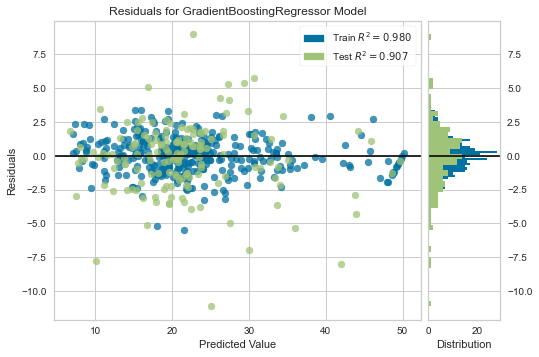

In [215]:
plot_model(best)

In [7]:
import pandas_profiling as pp 

pp.ProfileReport(all_data)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]